![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/visual-nlp/4.1.PDF_to_CHART_to_TEXT_LLM.ipynb)

### Colab Setup

In [ ]:
from google.colab import files
print('Please Upload your John Snow Labs License using the button below')
license_keys = files.upload()

Please Upload your John Snow Labs License using the button below


Saving spark_nlp_for_healthcare_spark_ocr_8734.json to spark_nlp_for_healthcare_spark_ocr_8734.json


In [ ]:
%pip install -q johnsnowlabs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.5/265.5 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 579.2/579.2 kB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.6/95.6 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.9/66.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 55.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.3/150.3 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 53.7 

In [ ]:
from johnsnowlabs import nlp


nlp.install(visual=True)

👌 Detected license file /content/spark_nlp_for_healthcare_spark_ocr_8734.json
📋 Stored John Snow Labs License in /root/.johnsnowlabs/licenses/license_number_0_for_Spark-Healthcare_Spark-OCR.json
👷 Setting up  John Snow Labs home in /root/.johnsnowlabs, this might take a few minutes.
🙆 JSL Home setup in /root/.johnsnowlabs
👌 Detected license file /content/spark_nlp_for_healthcare_spark_ocr_8734.json
Installing /root/.johnsnowlabs/py_installs/spark_nlp_jsl-5.4.0-py3-none-any.whl to /usr/bin/python3
👌 Detected license file /content/spark_nlp_for_healthcare_spark_ocr_8734.json
Installing /root/.johnsnowlabs/py_installs/spark_ocr-5.4.0-py3-none-any.whl to /usr/bin/python3
Installed 2 products:
💊 Spark-Healthcare==5.4.0 installed! ✅ Heal the planet with NLP! 
🕶 Spark-OCR==5.4.0 installed! ✅ Empower your NLP with a set of eyes 


In [ ]:
import warnings

warnings.filterwarnings('ignore')

from johnsnowlabs import nlp, medical, visual
import pandas as pd
from pyspark.sql import functions as F

spark = nlp.start(visual=True)

👌 Detected license file /content/spark_nlp_for_healthcare_spark_ocr_8734.json
👌 Launched cpu optimized session with with: 🚀Spark-NLP==5.4.0, 💊Spark-Healthcare==5.4.0, 🕶Spark-OCR==5.4.0, running on ⚡ PySpark==3.4.0


## Quick Introduction to Visual NLP

**Visual NLP** is a computer vision library capable of performing multiple tasks related to NLP.

Built on top of Spark, the library is performant at scale and can process huge amounts of documents in a distributed system.

Among the tasks available in the library, we have:

- Image pre-processing algorithms to improve text recognition results
  - Adaptive thresholding & denoising
  - Skew detection & correction
  - Adaptive scaling
- Layout Analysis & region detection
- Image cropping
- Removing background objects
- Text recognition, by combining NLP and OCR pipelines:
  - Extracting text from images (optical character recognition)
  - Support English, German, French, Spanish, Russian, Vietnamese and Arabic languages
- Extracting data from tables
- Recognizing and highlighting named entities in PDF documents
- Masking sensitive text in order to de-identify images
- Table detection and recognition from images
- Signature detection
- Visual document understanding
- Document classification
- Visual NER
- Output generation in different formats
  - PDF, images, or DICOM files with annotated or masked entities
Digital text for downstream processing in Spark NLP or other libraries
  - Structured data formats (JSON and CSV), as files or Spark data frames
- Scale out: distribute the OCR jobs across multiple nodes in a Spark cluster.
- Frictionless unification of OCR, NLP, ML & DL pipelines.


We focus on models and features that are useful in real-world applications. It works with images, PDF, DOCx, PPTx, and Dicom visual documents.

### Example Image Transformation


    Image #0:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 199 dpi
    Width: 582 px
    Height: 744 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


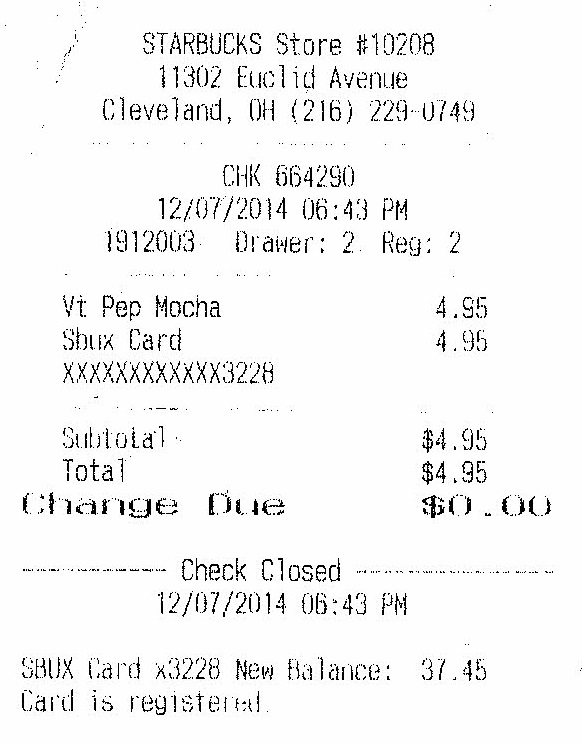

In [ ]:
imagePath = visual.pkg_resources.resource_filename('sparkocr', 'resources/ocr/images/check.jpg')
image_raw = spark.read.format("binaryFile").load(imagePath)
image_df = visual.BinaryToImage().transform(image_raw)
visual.display_images(image_df)

#### Erosion


    Image #0:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 199 dpi
    Width: 582 px
    Height: 744 px
    Mode: ImageType.TYPE_BYTE_BINARY
    Number of channels: 3


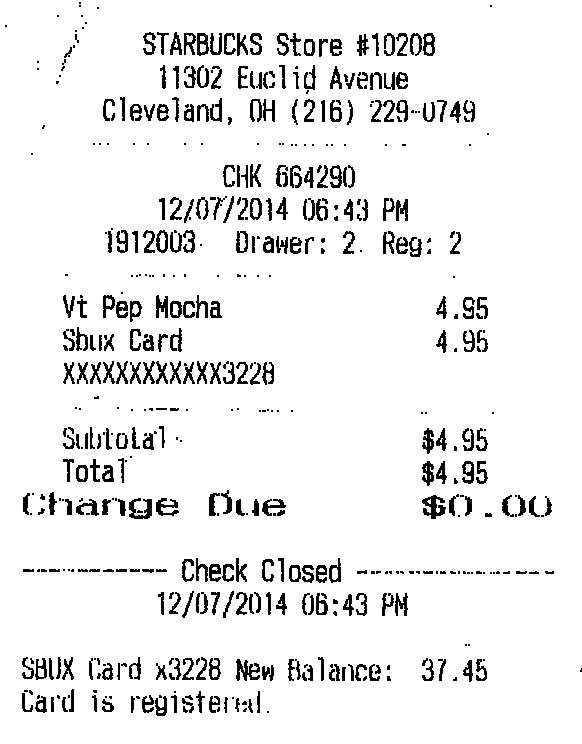

In [ ]:
eroded_image = visual.ImageTransformer() \
.addErodeTransform(2,2)\
.setInputCol("image") \
.setOutputCol("eroded_image") \
.transform(image_df)

visual.display_images(eroded_image, "eroded_image")

#### Remove objects


    Image #0:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 199 dpi
    Width: 1164 px
    Height: 1488 px
    Mode: ImageType.TYPE_BYTE_BINARY
    Number of channels: 3


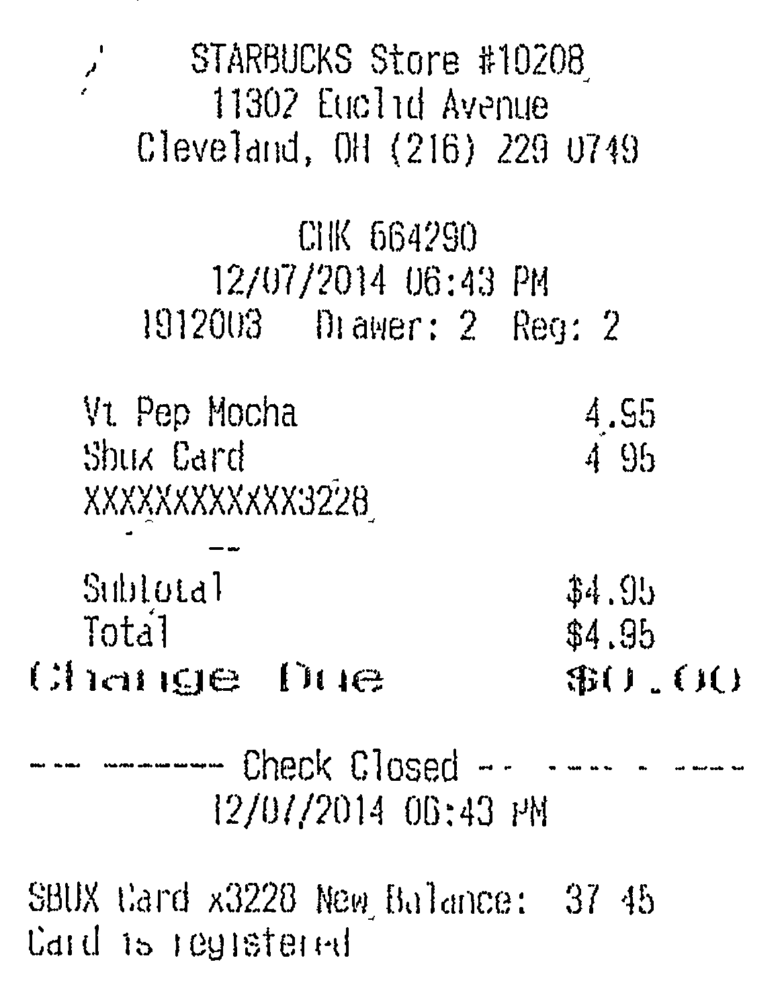

In [ ]:
multiple_image = visual.ImageTransformer() \
.addScalingTransform(2) \
.addAdaptiveThreshold(31, 2)\
.addRemoveObjects(10, 500) \
.setInputCol("image") \
.setOutputCol("multiple_image") \
.transform(image_df)

visual.display_images(multiple_image, "multiple_image")

### Document Layout

In [ ]:
imagePath = visual.pkg_resources.resource_filename('sparkocr', 'resources/ocr/pdfs/test_document.pdf')
image_raw = spark.read.format("binaryFile").load(imagePath)

In [ ]:
pdf_to_image = visual.PdfToImage() \
    .setInputCol("content") \
    .setOutputCol("image")

dit_layout = visual.DocumentLayoutAnalyzer \
    .pretrained("publaynet_dit_base_mrcnn_jsl", "en", "clinical/ocr") \
    .setInputCol("image") \
    .setOutputCol("regions") \
    .setScoreThreshold(0.5)

draw_regions = visual.ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("regions") \
    .setOutputCol("image_with_regions") \
    .setRectColor(visual.Color.green)

pipeline = visual.PipelineModel(stages=[
    pdf_to_image,
    dit_layout,
    draw_regions
])

publaynet_dit_base_mrcnn_jsl download started this may take some time.
Approximate size to download 401.2 MB



    Image #0:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/pdfs/test_document.pdf
    Resolution: 300 dpi
    Width: 5024 px
    Height: 6615 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


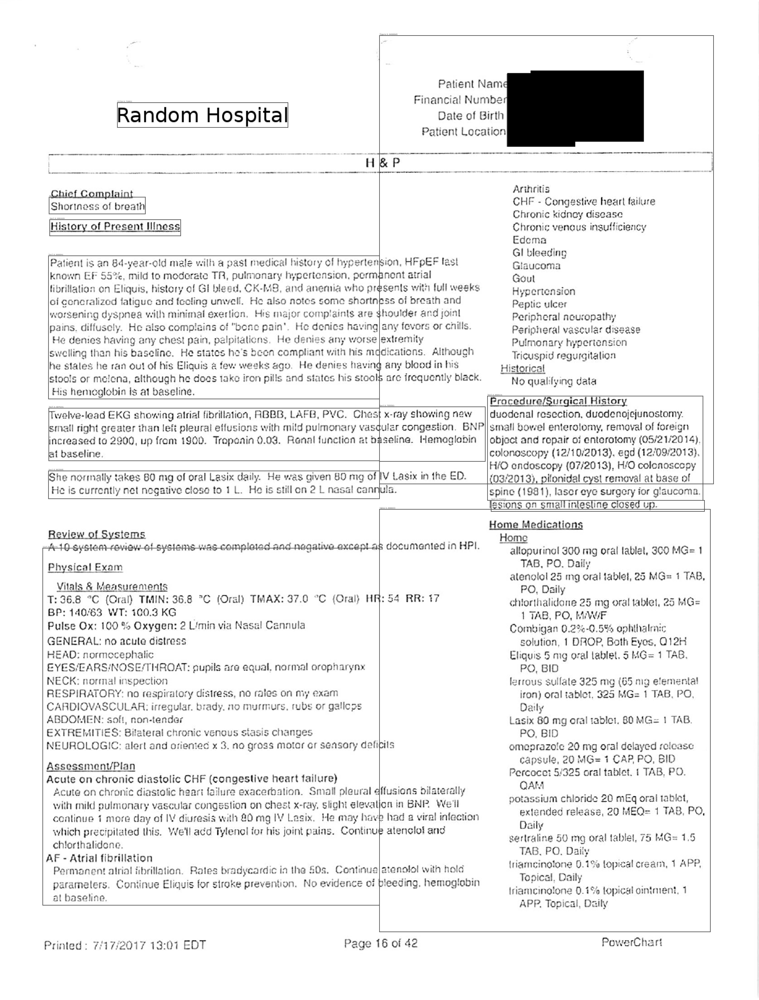


    Image #1:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/pdfs/test_document.pdf
    Resolution: 300 dpi
    Width: 5074 px
    Height: 6599 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


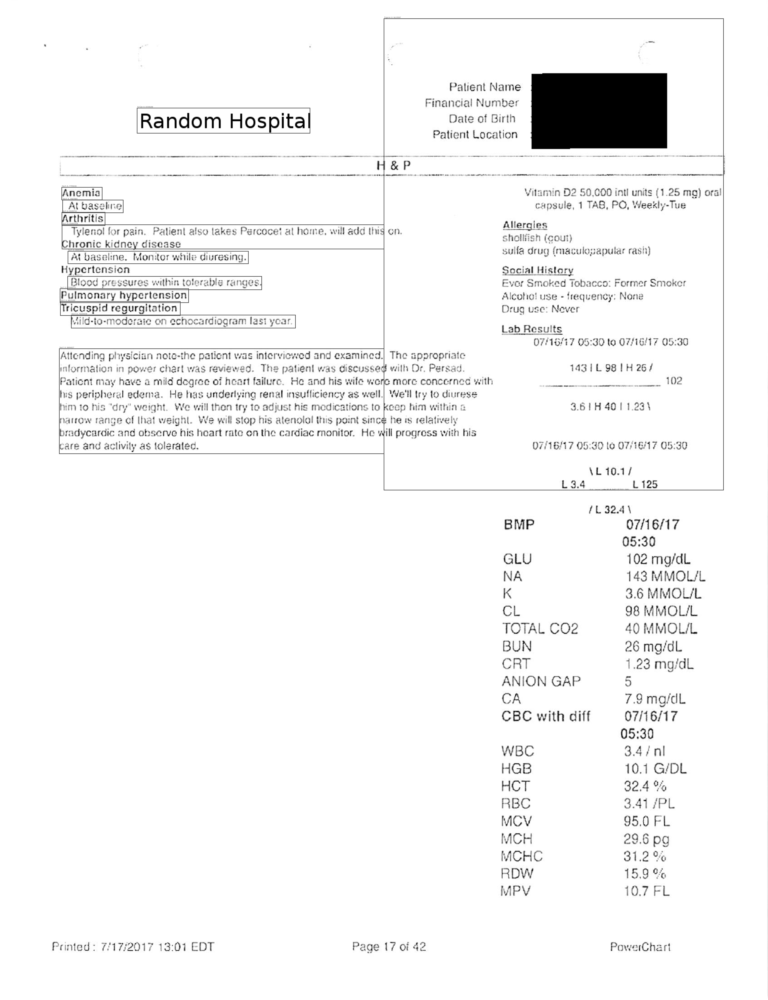

In [ ]:
result = pipeline.transform(image_raw).cache()
visual.display_images(result, "image_with_regions")

### Handwritten and Signature Detection

In [ ]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/data/handwritten/page1.jpeg -O signatures.jpeg

In [ ]:
imagePath = "./signatures.jpeg"
image_df = spark.read.format("binaryFile").load(imagePath).sort("path")

In [ ]:
binary_to_image = visual.BinaryToImage()
binary_to_image.setImageType(visual.ImageType.TYPE_3BYTE_BGR)

# Detect labels to deidentified in the input document
text_detector = visual.ImageDocumentRegionDetector \
    .pretrained("image_handwritten_detector_jsl", "en", "clinical/ocr") \
    .setInputCol("image") \
    .setOutputCol("regions") \
    .setScoreThreshold(0.25)

# Draw filled rectangle for hide sensitive data
draw_regions = visual.ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("regions") \
    .setOutputCol("image_with_regions") \
    .setFilledRect(False) \
    .setRectColor(visual.Color.gray)

# OCR pipeline
pipeline = visual.PipelineModel(stages=[
    binary_to_image,
    text_detector,
    draw_regions
])

image_handwritten_detector_jsl download started this may take some time.
Approximate size to download 265.9 MB



    Image #0:
    Origin: file:/content/signatures.jpeg
    Resolution: 0 dpi
    Width: 1705 px
    Height: 2203 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


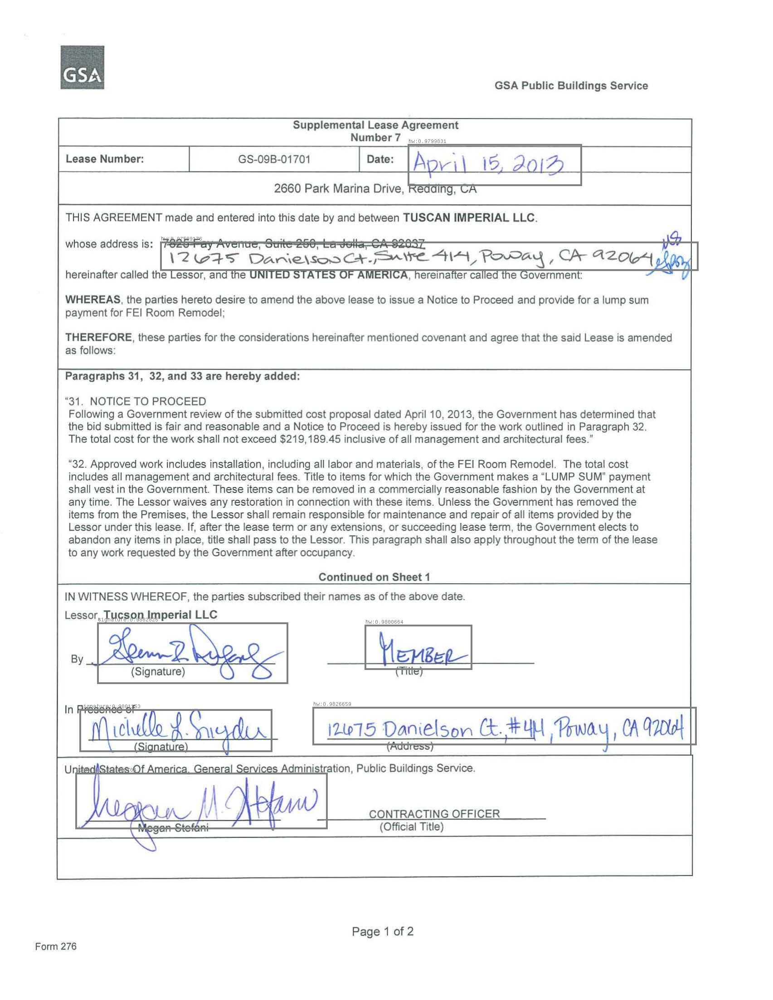

In [ ]:
result = pipeline.transform(image_df)
visual.display_images(result, "image_with_regions")

### PDF Table to Text

In [ ]:
pdf_example = visual.pkg_resources.resource_filename('sparkocr', 'resources/ocr/pdfs/tabular-pdf/data.pdf')
pdf_example_df = spark.read.format("binaryFile").load(pdf_example).cache()


    Image #0:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/pdfs/tabular-pdf/data.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


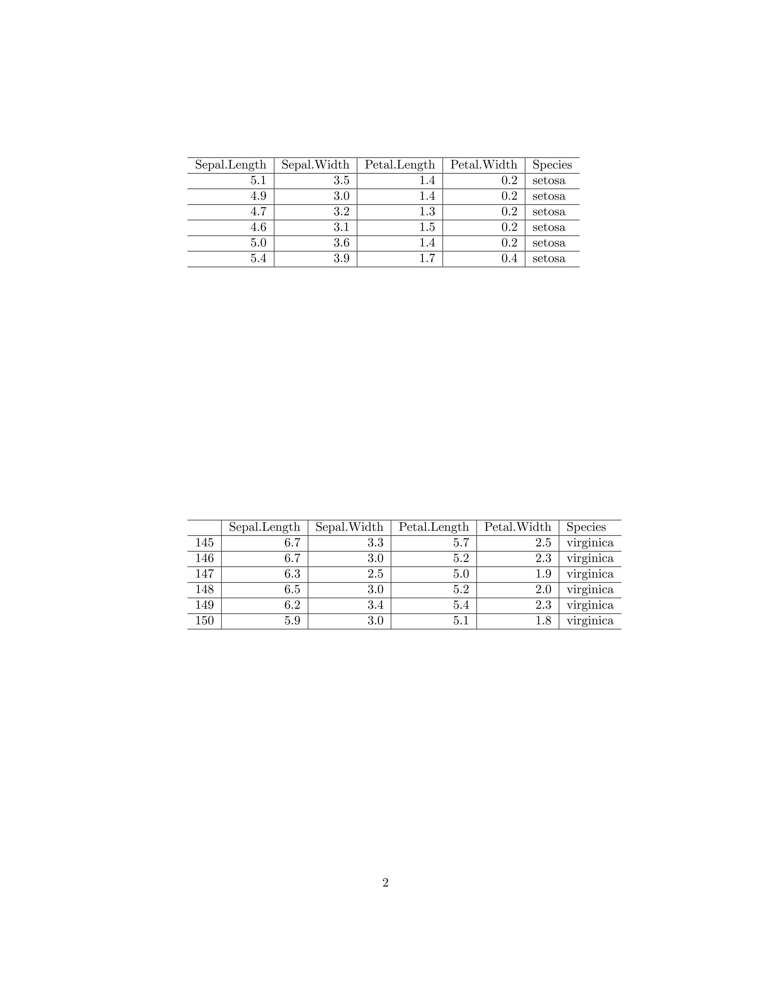


    Image #1:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/pdfs/tabular-pdf/data.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


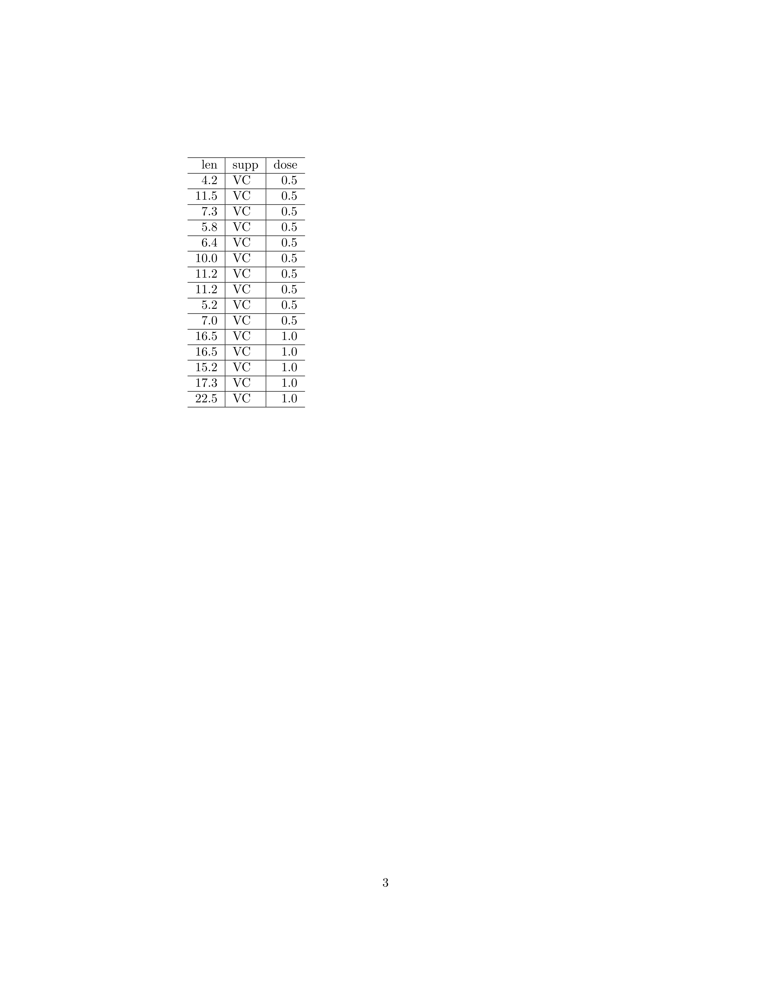


    Image #2:
    Origin: file:/usr/local/lib/python3.10/dist-packages/sparkocr/resources/ocr/pdfs/tabular-pdf/data.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


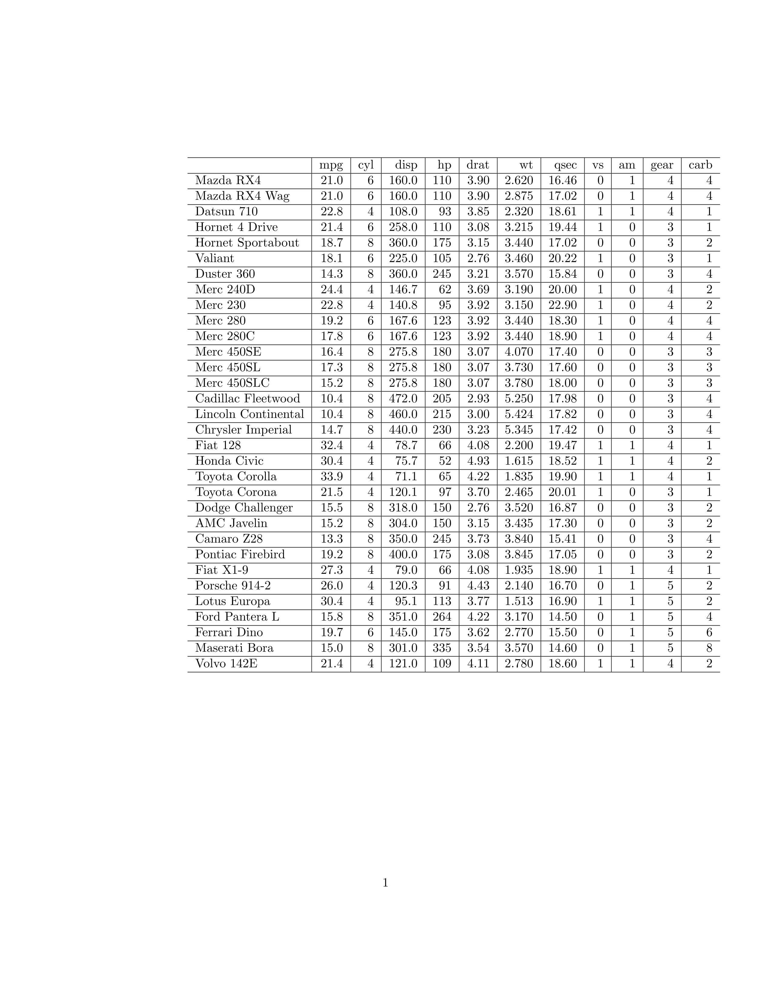

In [ ]:
image_df = visual.PdfToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .transform(pdf_example_df.select("content", "path"))

visual.display_images(image_df, "image")

In [ ]:
pdf_to_text_table = visual.PdfToTextTable() \
  .setInputCol("content")\
  .setOutputCol("table")\
  .setPageIndex(1)\
  .setMethod("basic")

table = pdf_to_text_table.transform(pdf_example_df)

In [ ]:
# First row
table.select(table["table.chunks"].getItem(1)["chunkText"]).show(1, False)

+------------------------------------------------------------------+
|table.chunks AS chunks#709[1].chunkText                           |
+------------------------------------------------------------------+
|[Mazda RX4, 21.0, 6, , 160.0, 110, 3.90, 2.620, 16.46, 0, 1, 4, 4]|
+------------------------------------------------------------------+



In [ ]:
# First element of first row
table.select(table["table.chunks"].getItem(1)["chunkText"][0]).show()

+------------------------------------------+
|table.chunks AS chunks#797[1].chunkText[0]|
+------------------------------------------+
|                                 Mazda RX4|
+------------------------------------------+



In [ ]:
# Table (top 10)
table.selectExpr("explode(table.chunks) as row_chunks").select("row_chunks.chunkText").show(10, truncate=False)

+--------------------------------------------------------------------------+
|chunkText                                                                 |
+--------------------------------------------------------------------------+
|[, mpg, cyl, , disp, hp, drat, wt, qsec, vs, am, gear, carb]              |
|[Mazda RX4, 21.0, 6, , 160.0, 110, 3.90, 2.620, 16.46, 0, 1, 4, 4]        |
|[Mazda RX4 Wag, 21.0, 6, , 160.0, 110, 3.90, 2.875, 17.02, 0, 1, 4, 4]    |
|[Datsun 710, 22.8, 4, , 108.0, 93, 3.85, 2.320, 18.61, 1, 1, 4, 1]        |
|[Hornet 4 Drive, 21.4, 6, , 258.0, 110, 3.08, 3.215, 19.44, 1, 0, 3, 1]   |
|[Hornet Sportabout, 18.7, 8, , 360.0, 175, 3.15, 3.440, 17.02, 0, 0, 3, 2]|
|[Valiant, 18.1, 6, , 225.0, 105, 2.76, 3.460, 20.22, 1, 0, 3, 1]          |
|[Duster 360, 14.3, 8, , 360.0, 245, 3.21, 3.570, 15.84, 0, 0, 3, 4]       |
|[Merc 240D, 24.4, 4, , 146.7, 62, 3.69, 3.190, 20.00, 1, 0, 4, 2]         |
|[Merc 230, 22.8, 4, , 140.8, 95, 3.92, 3.150, 22.90, 1, 0, 4, 2]          |

## Explain Chart data with LLM (Visual NLP + LLama2)

### Read images and display it

In [ ]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/pdfs/test_chart.pdf


    Image #0:
    Origin: file:/content/test_chart.pdf
    Resolution: 300 dpi
    Width: 2480 px
    Height: 3307 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


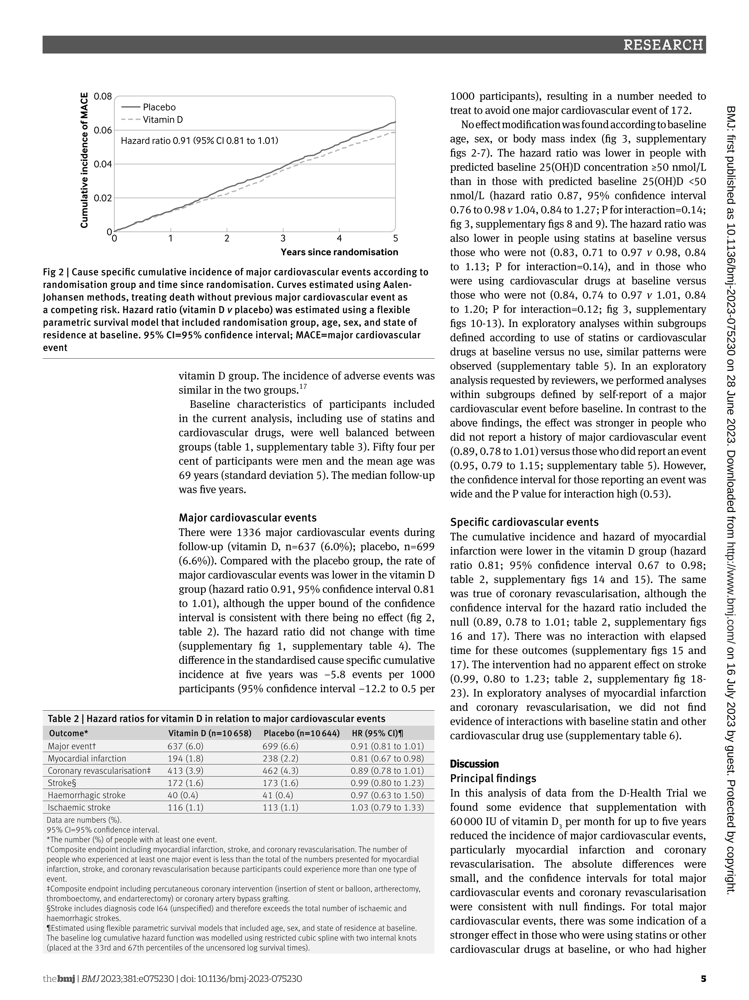

In [ ]:
pdf_path = "test_chart.pdf"
pdf_example_df = spark.read.format("binaryFile").load(pdf_path)
visual.display_pdf(pdf_example_df)

### Load Pipeline


In [ ]:
pdf_to_image = visual.PdfToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .setKeepInput(True)

dit_layout = visual.DocumentLayoutAnalyzer \
    .pretrained("publaynet_dit_base_mrcnn_jsl", "en", "clinical/ocr") \
    .setInputCol("image") \
    .setOutputCol("regions") \
    .setScoreThreshold(0.6) \
    .setOutputLabels(["figure"])

draw_regions = visual.ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("regions") \
    .setOutputCol("image_with_regions") \
    .setRectColor(visual.Color.green)

splitter = visual.ImageSplitRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("regions") \
    .setOutputCol("figure_image") \
    .setDropCols("image") \
    .setImageType(visual.ImageType.TYPE_3BYTE_BGR)

chart_to_text = visual.ChartToTextTable() \
    .pretrained("chart_to_text_deplot_jsl", "en", "clinical/ocr") \
    .setInputCol(["figure_image"]) \
    .setOutputCol("answers") \
    .setUseCaching(False)

pipeline = visual.PipelineModel(stages=[
    pdf_to_image,
    dit_layout,
    draw_regions,
    splitter,
    chart_to_text
])

publaynet_dit_base_mrcnn_jsl download started this may take some time.
Approximate size to download 401.2 MB
chart_to_text_deplot_jsl download started this may take some time.
Approximate size to download 999.7 MB


### Extract chart and chart data

In [ ]:
result = pipeline.transform(pdf_example_df)


    Image #0:
    Origin: file:/content/test_chart.pdf
    Resolution: 0 dpi
    Width: 1064 px
    Height: 544 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


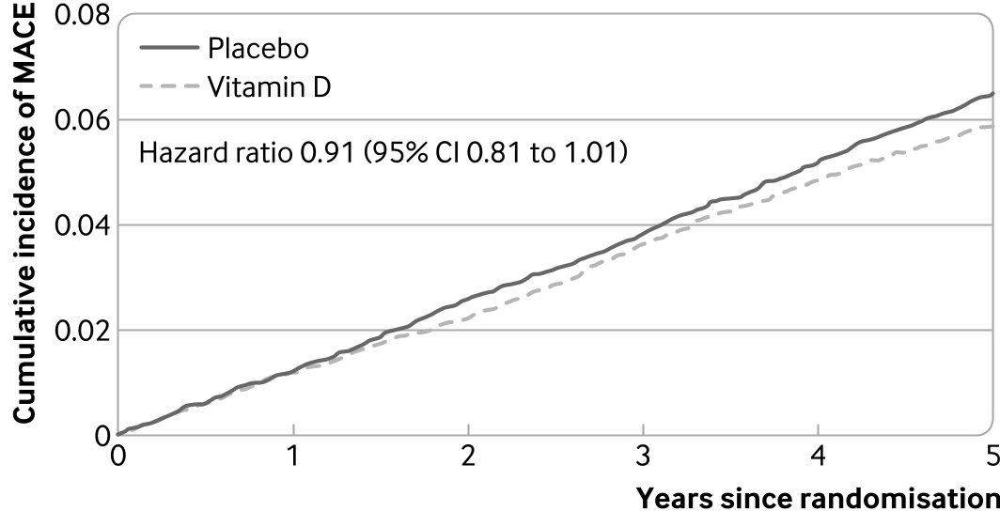

In [ ]:
visual.display_images(result, "figure_image")

In [ ]:
result = result.select(result.answers.answers).first()[0]
chart = result[0]
chart

'  TITLE |  <0x0A> Years since randomisation | Placebo | Vitamin D<0x0A>2000 | 0.00 | 0.01<0x0A>2005 | 0.00 | 0.02<0x0A>2010 | 0.00 | 0.02<0x0A>2015 | 0.00 | 0.04<0x0A>2017 | 0.00 | 0.02<0x0A>2018 | 0.00 | 0.03<0x0A>2019 | 0.00 | 0.04<0x0A>2020 | 0.00 | 0.02<0x0A>2021 | 0.00 | 0.02<0x0A>2022 | 0.03 | 0.02<0x0A>2023 | 0.04 | 0'

### Using LLM to explain the chart

In [ ]:
document_assembler = nlp.DocumentAssembler() \
    .setInputCol("text") \
    .setOutputCol("document")

llama2 = nlp.LLAMA2Transformer.pretrained() \
    .setInputCols(["document"]) \
    .setOutputCol("generation") \
    .setMinOutputLength(10) \
    .setMaxOutputLength(250) \
    .setDoSample(False) \
    .setTopK(50) \
    .setNoRepeatNgramSize(3)



llama_2_7b_chat_hf_int4 download started this may take some time.
Approximate size to download 4.4 GB
[OK!]


In [ ]:
# Conversation template
prompt_template = f'''SYSTEM: You are a helpful, respectful, and honest assistant. Always answer as helpfully.

USER: you are an expert in explaining charts. Can you please interpret as much as you can, the following information regarding a chart? "{chart}" (give me an answer please, this is not a conversation)

ASSISTANT:
'''

# Print the conversation template
print(prompt_template)


SYSTEM: You are a helpful, respectful, and honest assistant. Always answer as helpfully.

USER: you are an expert in explaining charts. Can you please interpret as much as you can, the following information regarding a chart? "  TITLE |  <0x0A> Years since randomisation | Placebo | Vitamin D<0x0A>2000 | 0.00 | 0.01<0x0A>2005 | 0.00 | 0.02<0x0A>2010 | 0.00 | 0.02<0x0A>2015 | 0.00 | 0.04<0x0A>2017 | 0.00 | 0.02<0x0A>2018 | 0.00 | 0.03<0x0A>2019 | 0.00 | 0.04<0x0A>2020 | 0.00 | 0.02<0x0A>2021 | 0.00 | 0.02<0x0A>2022 | 0.03 | 0.02<0x0A>2023 | 0.04 | 0" (give me an answer please, this is not a conversation)

ASSISTANT:



In [ ]:
llm_pipe = nlp.Pipeline(stages=[
    document_assembler,
    llama2
])


llm_model = llm_pipe.fit(spark.createDataFrame([['']]).toDF("text"))

In [ ]:
prompt_df = spark.createDataFrame([[prompt_template]]).toDF("text")

llm_res = llm_model.transform(prompt_df)
llm_res.select("generation.result").show(truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
output = """
The chart shows the average change in VitaminD levels over time for a group of people who were either randomized to receive a placebo or Vitamin d supplements. The x-axis represents the years since randomization, and the y-axis shows the change in vitamin D levels.\nThe data points for each year are as follows:\n* 20O0: 0 Vitamin Д levels\n*20 O5:  VitaminД levels increased by 0,01\n* twenty O10: Vitamin Да levels increased bу 0 ,02\n* Twenty O15: Vitamine D levels increased hy 0 .04\n*Twenty O 17: Vitаmine D levels decreased by  о.0 2\n * Twenty О 18: Vitami D levels deсreased by о.о2\n\nBased on the data provided, it appears that the group of peoplе who received the Vitamin В supplement hаve аverage increase in Vitаmin D levels over timе.
"""

In [ ]:
import textwrap


output = textwrap.fill(output, width=100)
print(output)

 The chart shows the average change in VitaminD levels over time for a group of people who were
either randomized to receive a placebo or Vitamin d supplements. The x-axis represents the years
since randomization, and the y-axis shows the change in vitamin D levels. The data points for each
year are as follows: * 20O0: 0 Vitamin Д levels *20 O5:  VitaminД levels increased by 0,01 * twenty
O10: Vitamin Да levels increased bу 0 ,02 * Twenty O15: Vitamine D levels increased hy 0 .04 *Twenty
O 17: Vitаmine D levels decreased by  о.0 2  * Twenty О 18: Vitami D levels deсreased by о.о2  Based
on the data provided, it appears that the group of peoplе who received the Vitamin В supplement hаve
аverage increase in Vitаmin D levels over timе.


> **We analyzed a chart using a pretrained LLM. Following the same steps, we could analyze tables, OCR-extracted text, etc.**